Image loaded successfully.
🔴 Red Light Detected


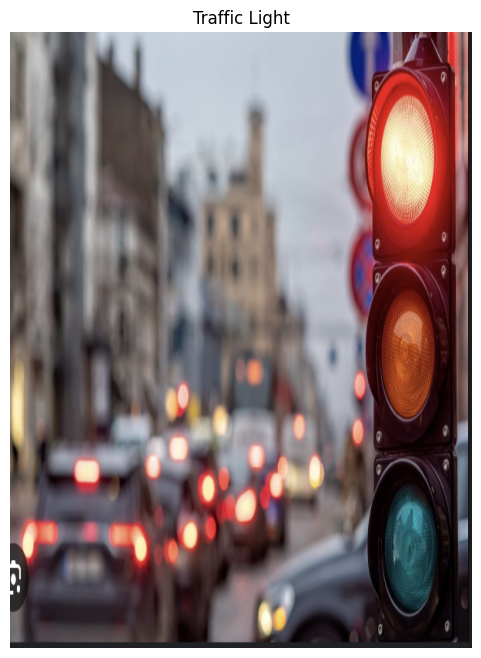

In [3]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the image
image = cv2.imread("traffic_light.png")
if image is None:
    print("Image not found.")
else:
    print("Image loaded successfully.")

# Resize for visibility
image = cv2.resize(image, (600, 800))

# Convert to RGB (for matplotlib) and HSV (for mask)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define HSV ranges
red_lower = np.array([0, 100, 100])
red_upper = np.array([10, 255, 255])

yellow_lower = np.array([15, 100, 100])
yellow_upper = np.array([35, 255, 255])

green_lower = np.array([40, 100, 100])
green_upper = np.array([90, 255, 255])

# Masks
mask_red = cv2.inRange(hsv, red_lower, red_upper)
mask_yellow = cv2.inRange(hsv, yellow_lower, yellow_upper)
mask_green = cv2.inRange(hsv, green_lower, green_upper)

# Detection logic
if cv2.countNonZero(mask_red) > 300:
    print("🔴 Red Light Detected")
elif cv2.countNonZero(mask_yellow) > 300:
    print("🟡 Yellow Light Detected")
elif cv2.countNonZero(mask_green) > 300:
    print("🟢 Green Light Detected")
else:
    print("⚠️ No traffic light color detected.")

# Show image using matplotlib
plt.figure(figsize=(6, 8))
plt.imshow(image_rgb)
plt.axis('off')
plt.title("Traffic Light")
plt.show()


🖼 Found 12 image(s) to process.



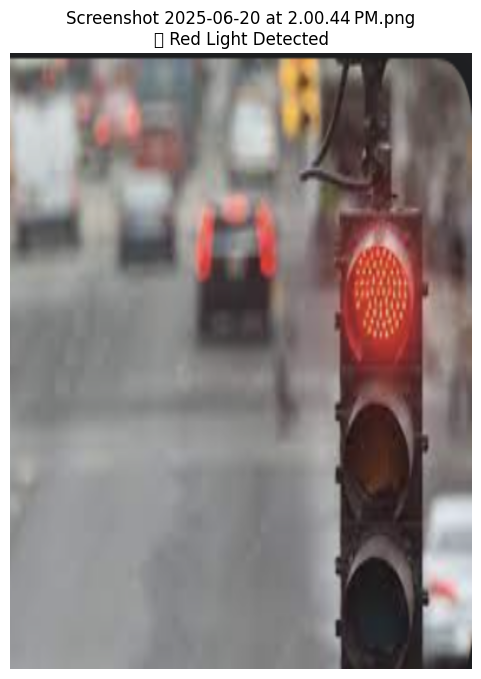

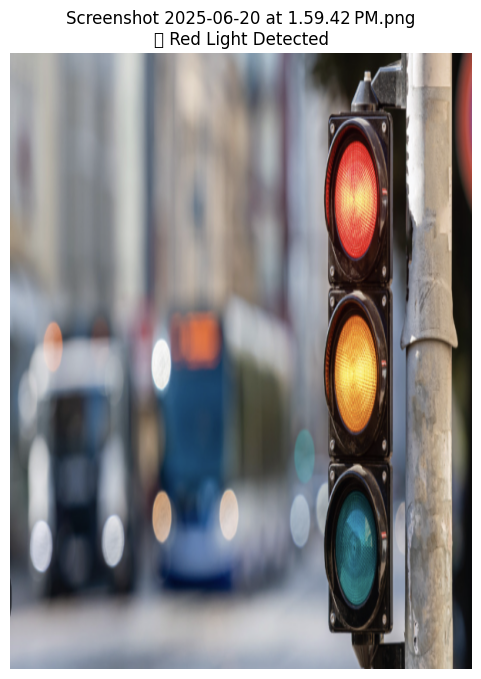

/Users/deepanshudalal/.local/pipx/venvs/notebook/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128993 (\N{LARGE YELLOW CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


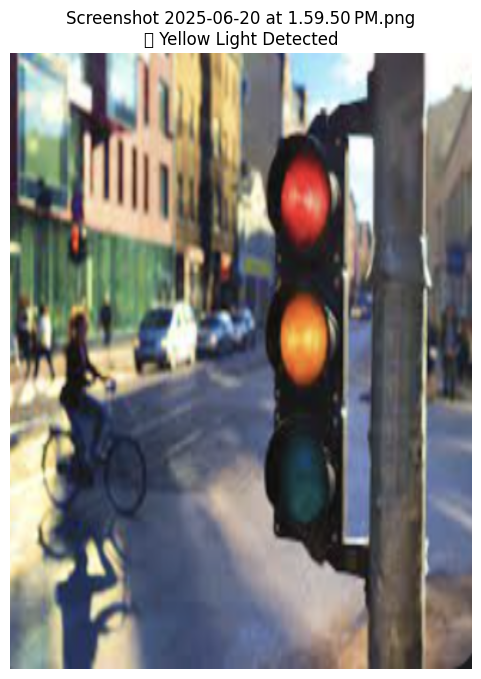

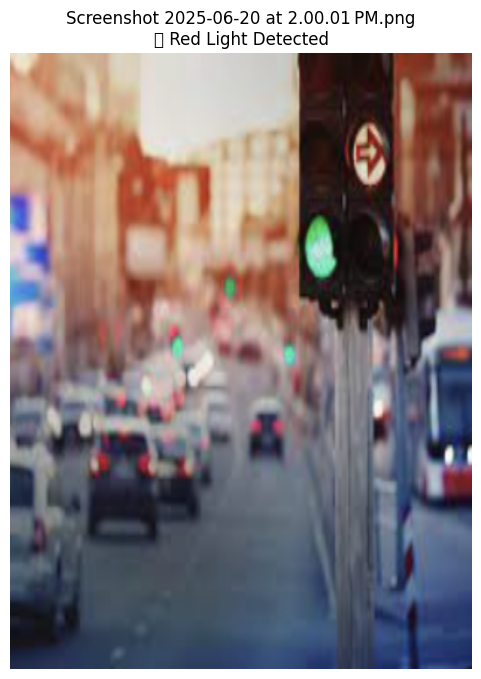

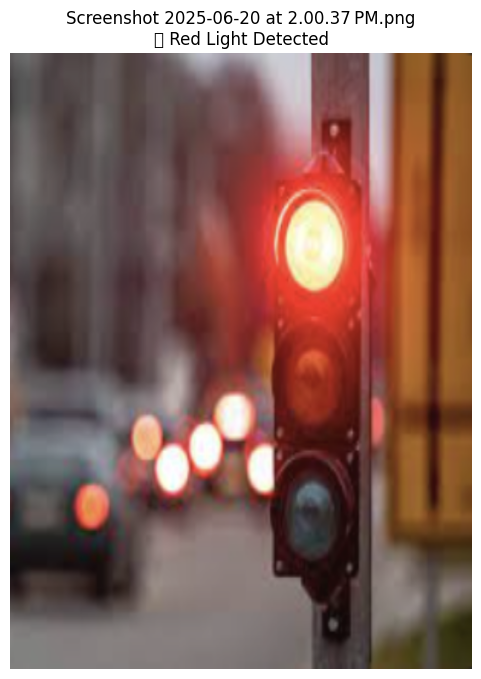

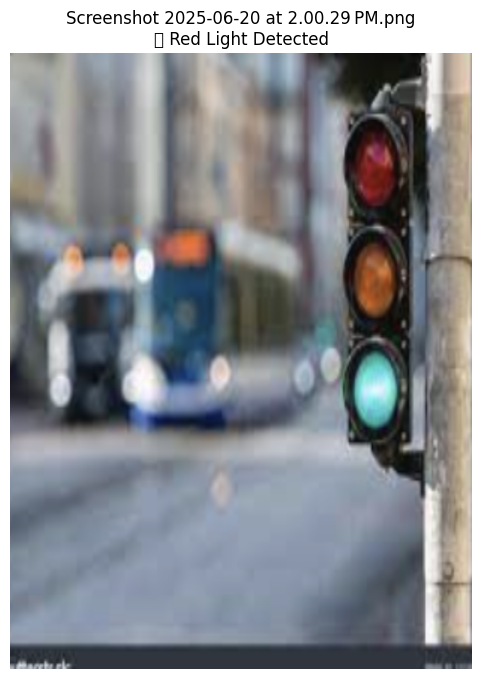

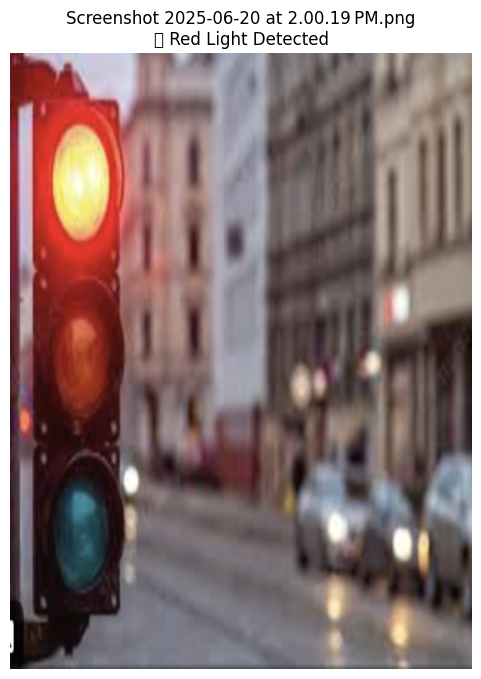

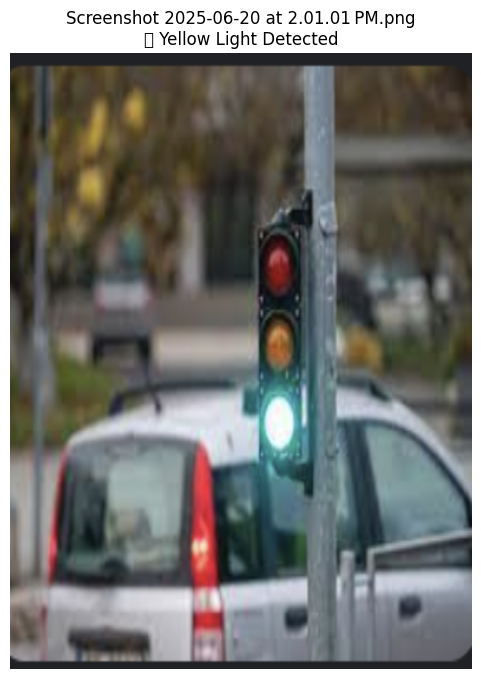

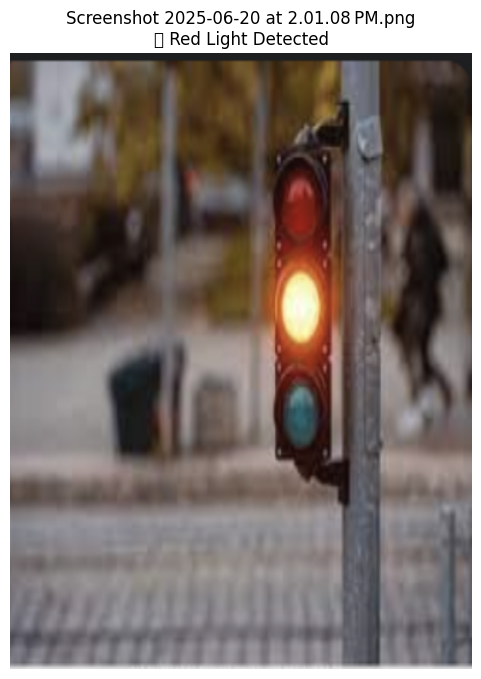

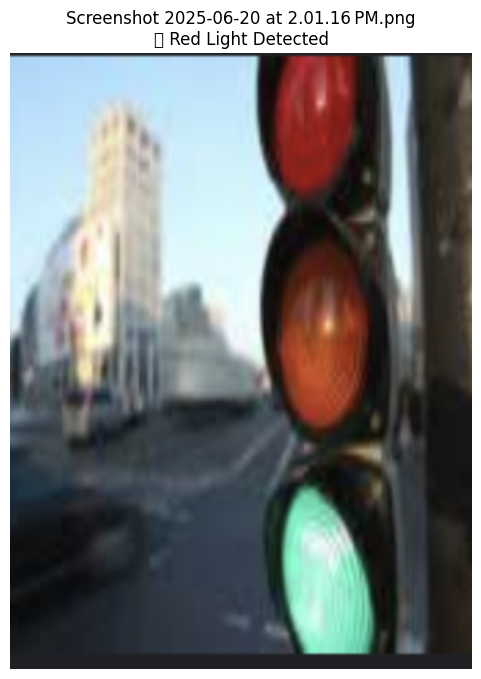

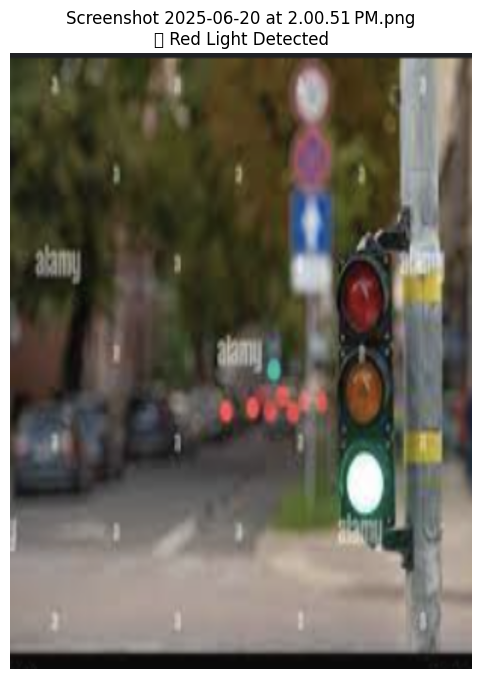

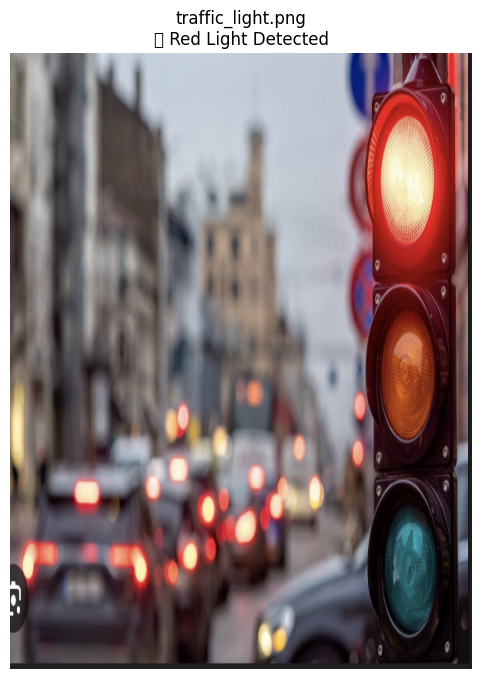

In [10]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os

# 📂 Step 1: Auto-detect image files in folder
folder_path = '.'  # Current folder
image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

print(f"🖼 Found {len(image_files)} image(s) to process.\n")

# 🧠 Step 2: Define detection function
def detect_traffic_light(image_path):
    image = cv2.imread(image_path)
    if image is None:
        print(f"❌ Failed to load: {image_path}")
        return

    # Resize and convert
    image = cv2.resize(image, (600, 800))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # ✅ Improved HSV Ranges
    red_lower1 = np.array([0, 100, 100])
    red_upper1 = np.array([10, 255, 255])
    red_lower2 = np.array([160, 100, 100])
    red_upper2 = np.array([180, 255, 255])

    yellow_lower = np.array([15, 100, 100])
    yellow_upper = np.array([35, 255, 255])

    green_lower = np.array([40, 100, 100])
    green_upper = np.array([90, 255, 255])

    # 🎭 Create Masks
    mask_red1 = cv2.inRange(hsv, red_lower1, red_upper1)
    mask_red2 = cv2.inRange(hsv, red_lower2, red_upper2)
    mask_red = cv2.bitwise_or(mask_red1, mask_red2)

    mask_yellow = cv2.inRange(hsv, yellow_lower, yellow_upper)
    mask_green = cv2.inRange(hsv, green_lower, green_upper)

    # 🧮 Count non-zero pixels
    red_count = cv2.countNonZero(mask_red)
    yellow_count = cv2.countNonZero(mask_yellow)
    green_count = cv2.countNonZero(mask_green)

    # 🔍 Decision based on max count
    max_color = max(red_count, yellow_count, green_count)
    if max_color == red_count:
        status = "🔴 Red Light Detected"
    elif max_color == yellow_count:
        status = "🟡 Yellow Light Detected"
    elif max_color == green_count:
        status = "🟢 Green Light Detected"
    else:
        status = "⚠️ No traffic light color detected"

    # 🖼️ Display image + result
    plt.figure(figsize=(6, 8))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(f"{os.path.basename(image_path)}\n{status}")
    plt.show()

# 🚦 Step 3: Run detection on all images
for img_file in image_files:
    detect_traffic_light(img_file)


In [17]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os

folder_path = '.'  # current folder
image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

print(f"🖼 Found {len(image_files)} image(s) to process.\n")

def detect_traffic_light(image_path):
    image = cv2.imread(image_path)
    if image is None:
        print(f"❌ Couldn't load: {image_path}")
        return

    image = cv2.resize(image, (600, 800))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Color ranges (adjusted)
    red_lower1 = np.array([0, 120, 70])
    red_upper1 = np.array([10, 255, 255])
    red_lower2 = np.array([160, 120, 70])
    red_upper2 = np.array([180, 255, 255])

    yellow_lower = np.array([18, 150, 150])
    yellow_upper = np.array([35, 255, 255])

    green_lower = np.array([40, 40, 40])
    green_upper = np.array([90, 255, 255])

    # Create color masks
    mask_red1 = cv2.inRange(hsv, red_lower1, red_upper1)
    mask_red2 = cv2.inRange(hsv, red_lower2, red_upper2)
    mask_red = cv2.bitwise_or(mask_red1, mask_red2)
    mask_yellow = cv2.inRange(hsv, yellow_lower, yellow_upper)
    mask_green = cv2.inRange(hsv, green_lower, green_upper)

    # Find contours for each mask
    def get_largest_contour_area(mask):
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        max_area = 0
        for cnt in contours:
            area = cv2.contourArea(cnt)
            if area > max_area:
                max_area = area
        return max_area

    red_area = get_largest_contour_area(mask_red)
    yellow_area = get_largest_contour_area(mask_yellow)
    green_area = get_largest_contour_area(mask_green)

    # Apply a minimum area threshold to ignore noise
    min_area = 300  # adjust if needed

    print(f"Image: {image_path}")
    print(f"Red area: {red_area}, Yellow area: {yellow_area}, Green area: {green_area}\n")

    result = "⚠️ No traffic light color detected"
    if red_area > yellow_area and red_area > green_area and red_area > min_area:
        result = "🔴 Red Light Detected"
    elif yellow_area > red_area and yellow_area > green_area and yellow_area > min_area:
        result = "🟡 Yellow Light Detected"
    elif green_area > red_area and green_area > yellow_area and green_area > min_area:
        result = "🟢 Green Light Detected"

    # Show result
    plt.figure(figsize=(6, 8))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(f"{os.path.basename(image_path)}\n{result}")
    # Show all masks side by side
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(mask_red, cmap='gray')
    plt.title("Red Mask")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(mask_yellow, cmap='gray')
    plt.title("Yellow Mask")
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(mask_green, cmap='gray')
    plt.title("Green Mask")
    plt.axis('off')
    plt.show()
    
    # Run detection
    for img_file in image_files:
        detect_traffic_light(img_file)


🖼 Found 12 image(s) to process.



🖼 Found 12 image(s) to process.

📷 Screenshot 2025-06-20 at 2.00.44 PM.png
🔴 Red area: 32627.5, 🟡 Yellow area: 367.5, 🟢 Green area: 0



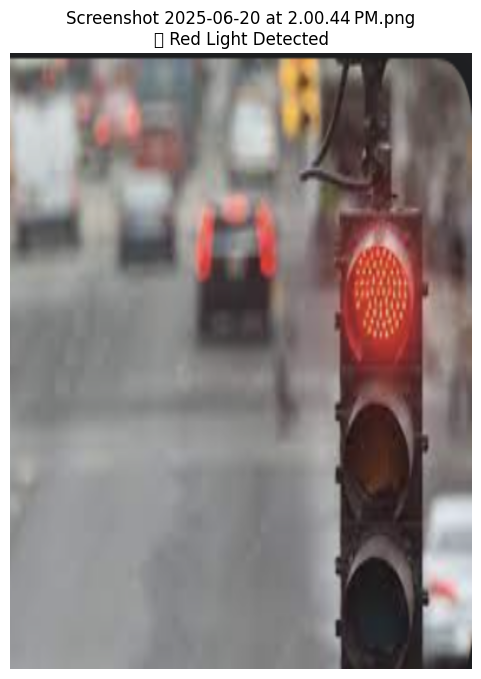

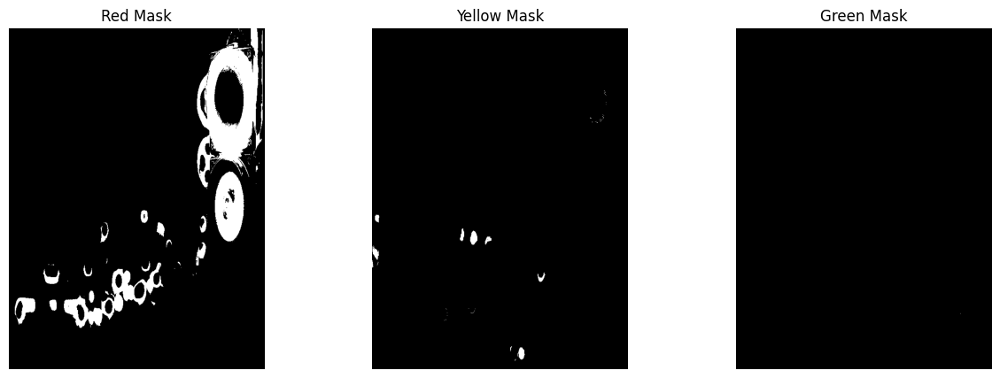

📷 Screenshot 2025-06-20 at 1.59.42 PM.png
🔴 Red area: 32627.5, 🟡 Yellow area: 367.5, 🟢 Green area: 0



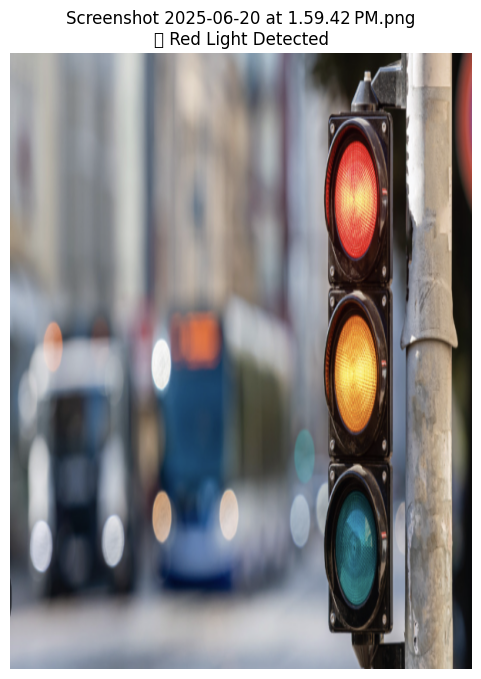

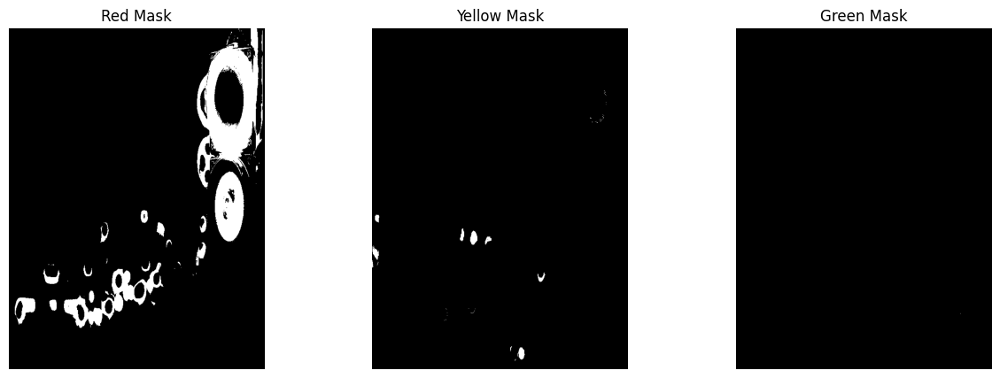

📷 Screenshot 2025-06-20 at 1.59.50 PM.png
🔴 Red area: 32627.5, 🟡 Yellow area: 367.5, 🟢 Green area: 0



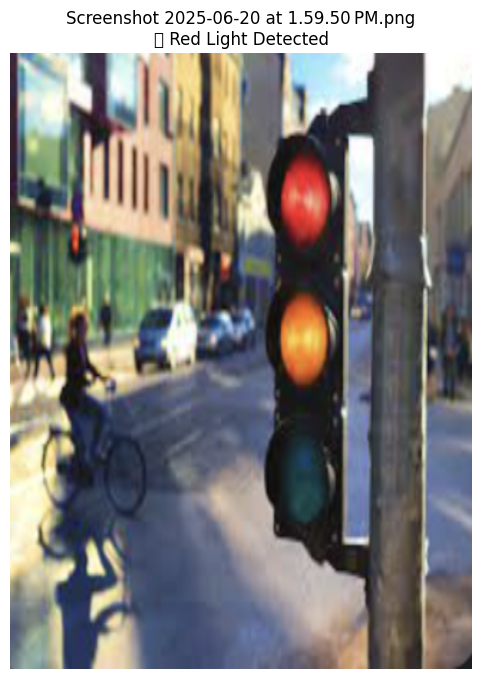

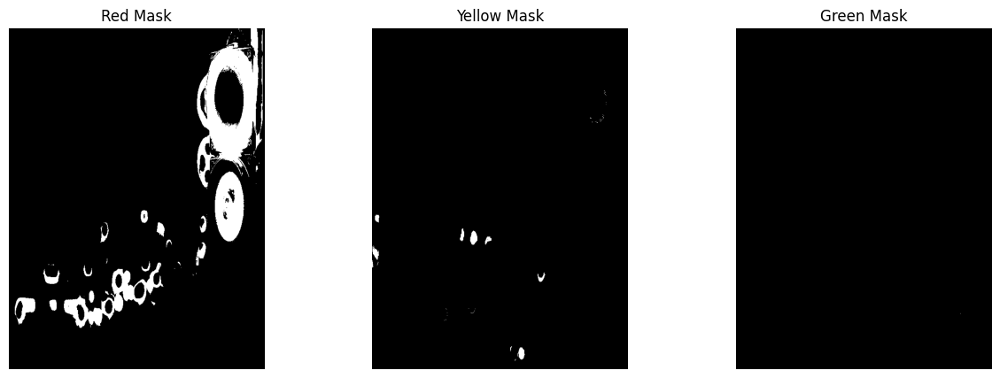

📷 Screenshot 2025-06-20 at 2.00.01 PM.png
🔴 Red area: 32627.5, 🟡 Yellow area: 367.5, 🟢 Green area: 0



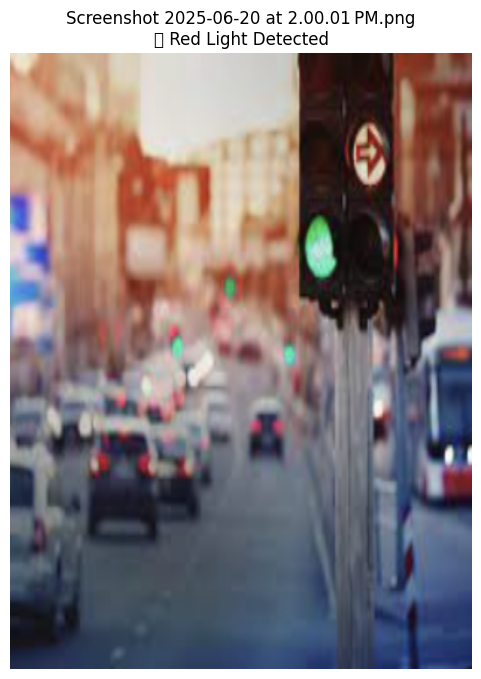

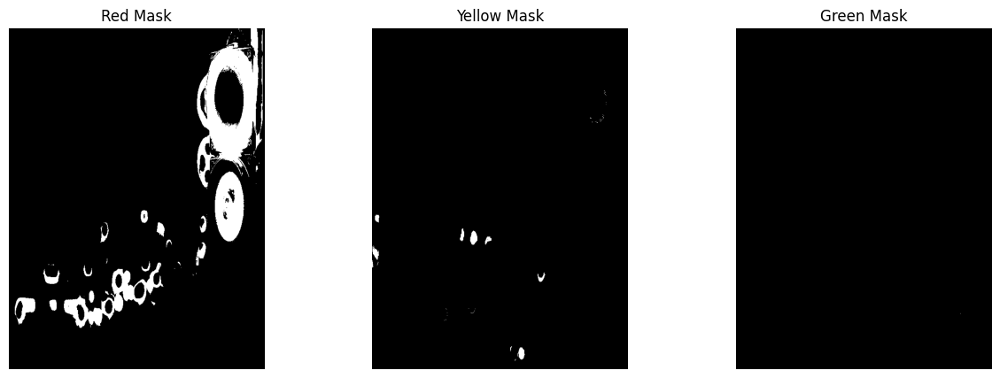

📷 Screenshot 2025-06-20 at 2.00.37 PM.png
🔴 Red area: 32627.5, 🟡 Yellow area: 367.5, 🟢 Green area: 0



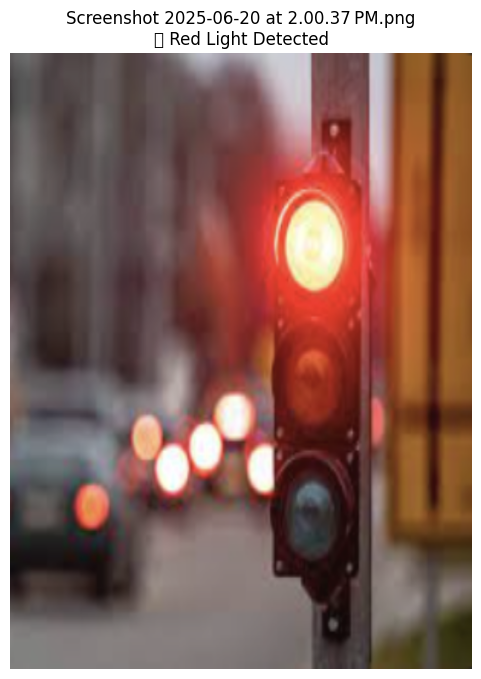

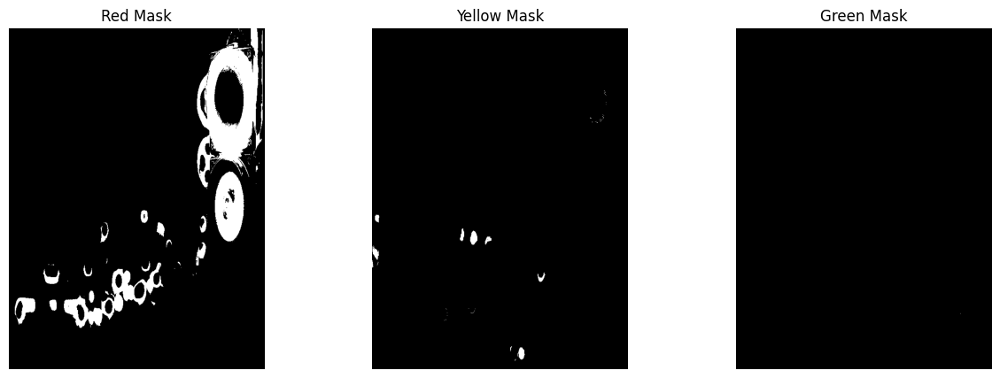

📷 Screenshot 2025-06-20 at 2.00.29 PM.png
🔴 Red area: 32627.5, 🟡 Yellow area: 367.5, 🟢 Green area: 0



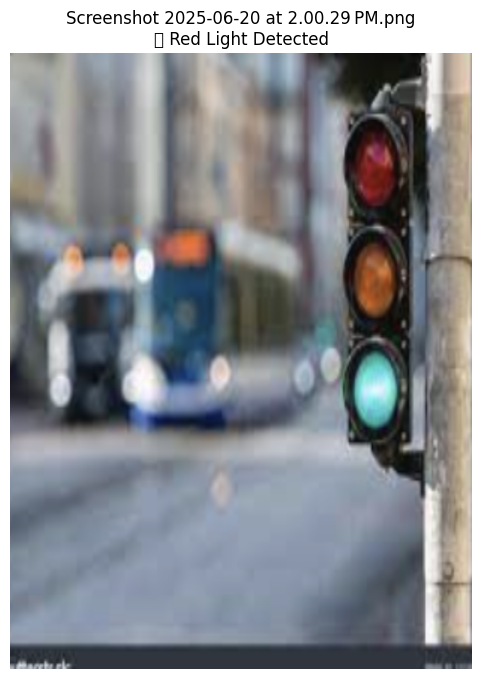

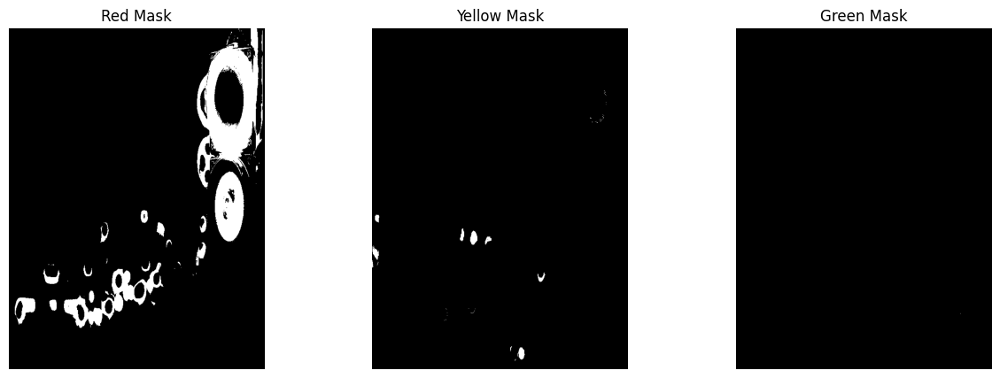

📷 Screenshot 2025-06-20 at 2.00.19 PM.png
🔴 Red area: 32627.5, 🟡 Yellow area: 367.5, 🟢 Green area: 0



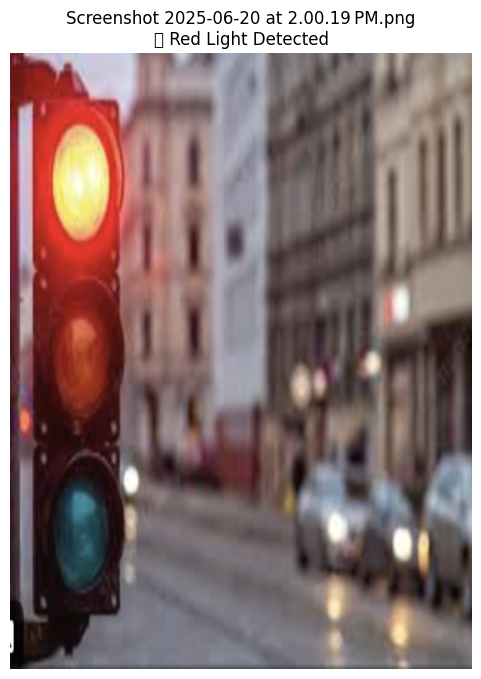

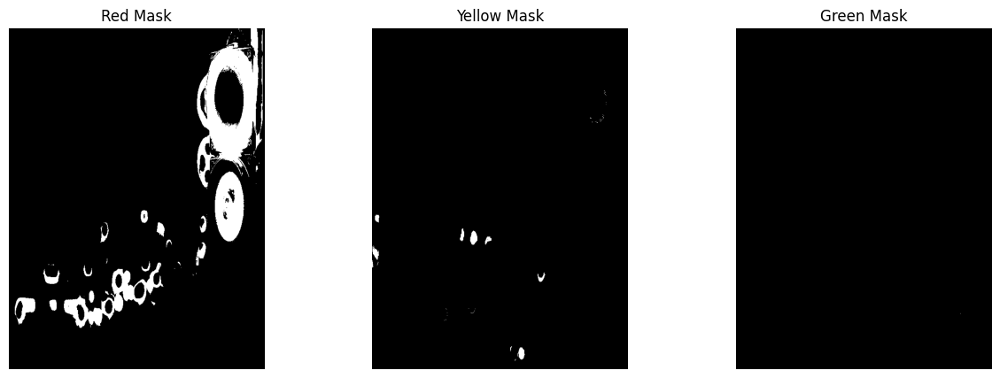

📷 Screenshot 2025-06-20 at 2.01.01 PM.png
🔴 Red area: 32627.5, 🟡 Yellow area: 367.5, 🟢 Green area: 0



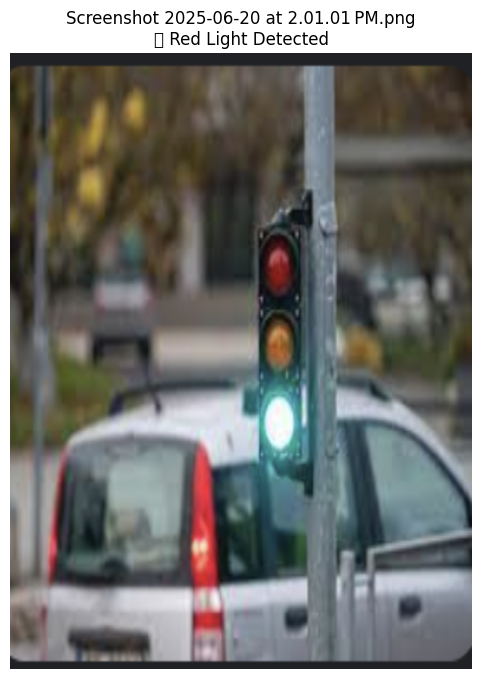

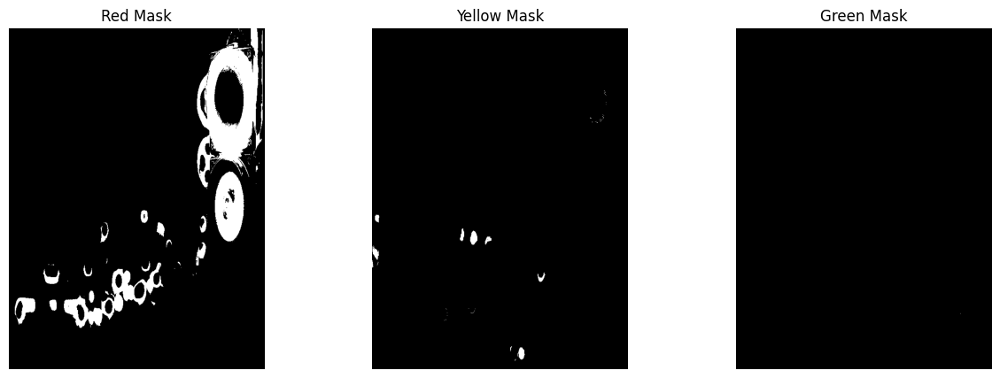

📷 Screenshot 2025-06-20 at 2.01.08 PM.png
🔴 Red area: 32627.5, 🟡 Yellow area: 367.5, 🟢 Green area: 0



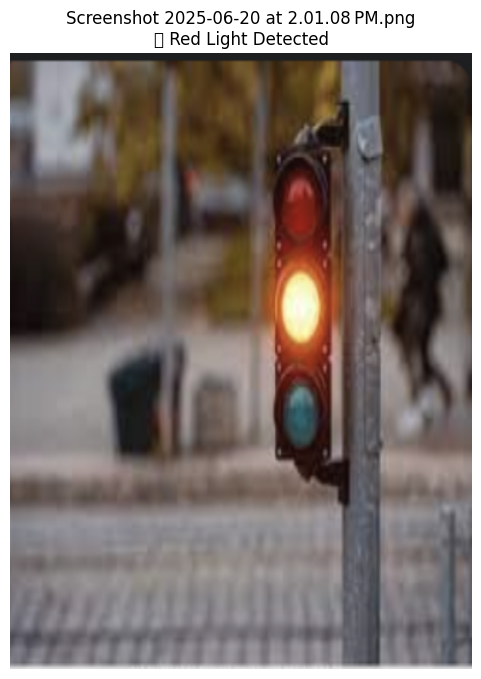

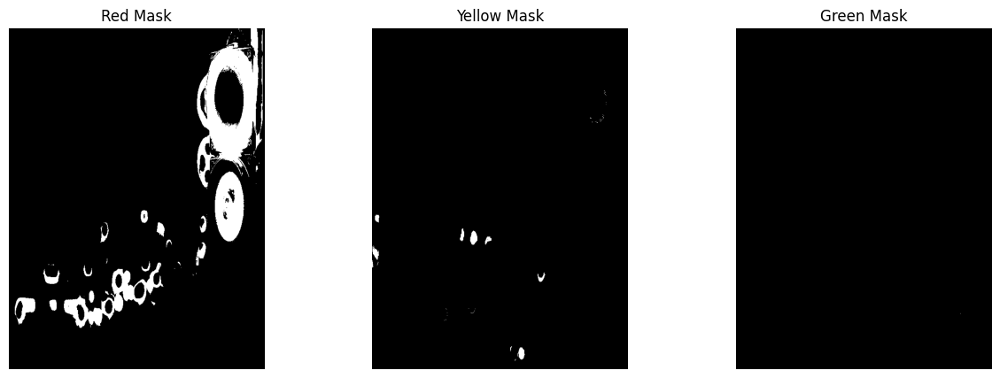

📷 Screenshot 2025-06-20 at 2.01.16 PM.png
🔴 Red area: 32627.5, 🟡 Yellow area: 367.5, 🟢 Green area: 0



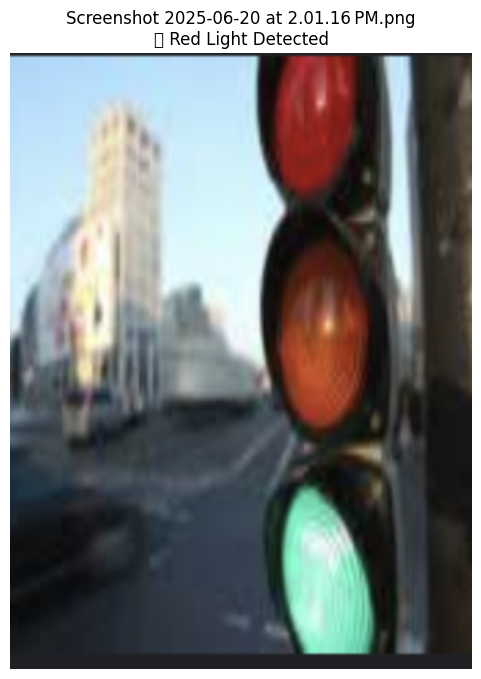

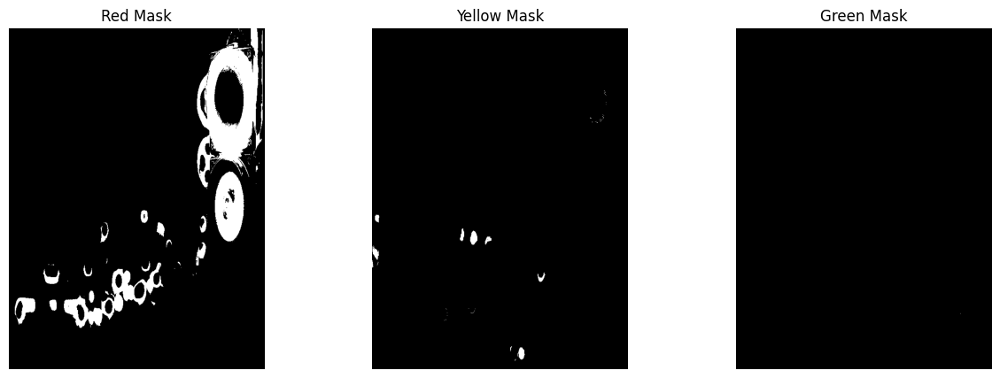

📷 Screenshot 2025-06-20 at 2.00.51 PM.png
🔴 Red area: 32627.5, 🟡 Yellow area: 367.5, 🟢 Green area: 0



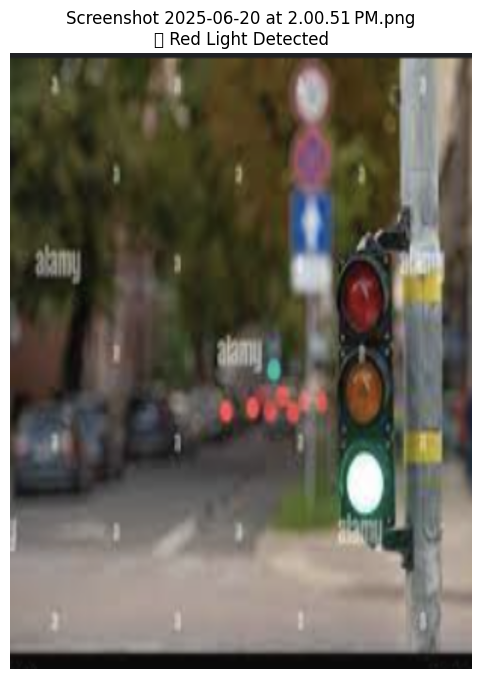

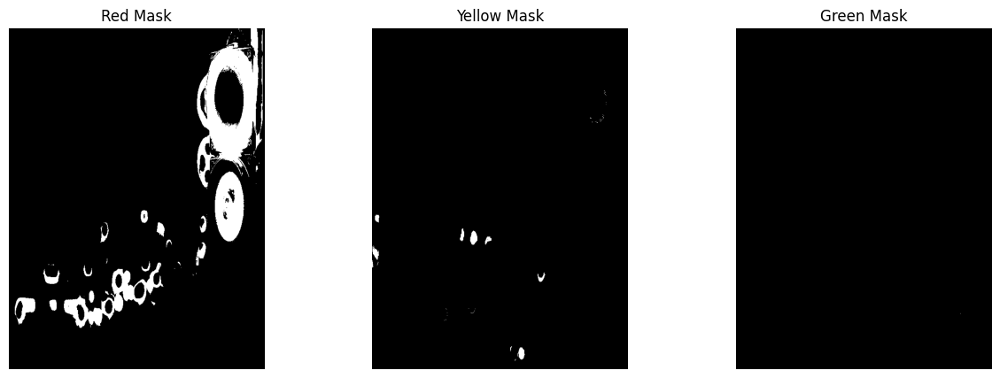

📷 traffic_light.png
🔴 Red area: 32627.5, 🟡 Yellow area: 367.5, 🟢 Green area: 0



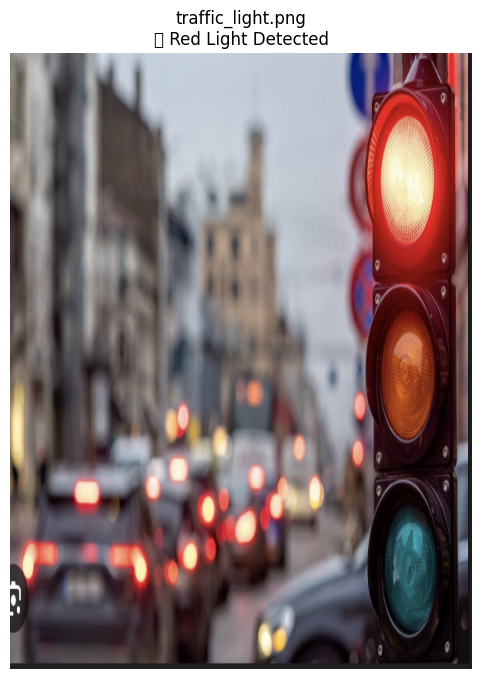

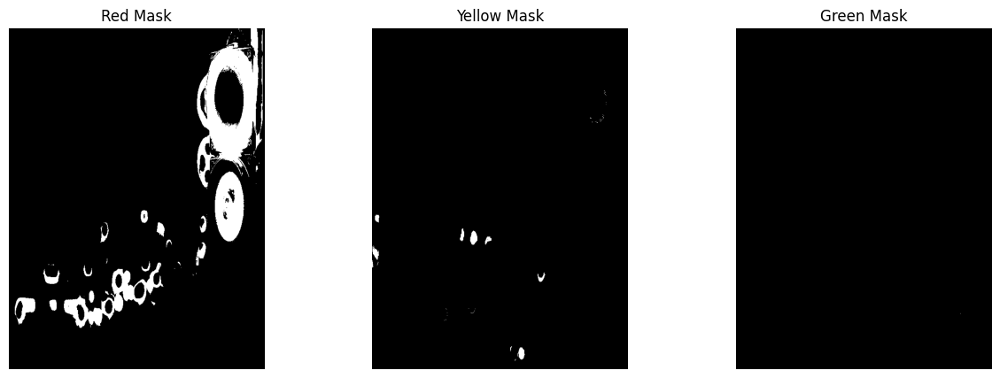

In [20]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os

# 🔍 Step 1: List images
folder_path = '.'  # current folder
image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

print(f"🖼 Found {len(image_files)} image(s) to process.\n")

# 🧠 Step 2: Detection function
def detect_traffic_light(image_path):
    image = cv2.imread(image_path)
    if image is None:
        print(f"❌ Couldn't load: {image_path}")
        return

    image = cv2.resize(image, (600, 800))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # 🎨 HSV Color Ranges
    red_lower1 = np.array([0, 150, 150])
    red_upper1 = np.array([10, 255, 255])
    red_lower2 = np.array([160, 150, 150])
    red_upper2 = np.array([180, 255, 255])

    yellow_lower = np.array([18, 150, 150])
    yellow_upper = np.array([35, 255, 255])

    green_lower = np.array([40, 100, 100])
    green_upper = np.array([90, 255, 255])


    # 🔍 Largest contour detection
    def get_largest_contour_area(mask):
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        max_area = 0
        for cnt in contours:
            area = cv2.contourArea(cnt)
            if area > max_area:
                max_area = area
        return max_area

    red_area = get_largest_contour_area(mask_red)
    yellow_area = get_largest_contour_area(mask_yellow)
    green_area = get_largest_contour_area(mask_green)

    # ✅ Optional debug print
    print(f"📷 {image_path}")
    print(f"🔴 Red area: {red_area}, 🟡 Yellow area: {yellow_area}, 🟢 Green area: {green_area}\n")

    # 🚦 Detection logic
    min_area = 300
        # ✅ Better decision logic
    areas = {
        "🔴 Red": red_area if red_area > min_area else 0,
        "🟡 Yellow": yellow_area if yellow_area > min_area else 0,
        "🟢 Green": green_area if green_area > min_area else 0,
    }

    dominant_color = max(areas, key=areas.get)
    if areas[dominant_color] > 0:
        result = f"{dominant_color} Light Detected"
    else:
        result = "⚠️ No traffic light color detected"


    # 🖼️ Show original image with result
    plt.figure(figsize=(6, 8))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(f"{os.path.basename(image_path)}\n{result}")
    plt.show()

    # 🎭 Show masks
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(mask_red, cmap='gray')
    plt.title("Red Mask")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mask_yellow, cmap='gray')
    plt.title("Yellow Mask")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(mask_green, cmap='gray')
    plt.title("Green Mask")
    plt.axis('off')

    plt.show()

# ✅ Step 3: Run detection for each image
for img_file in image_files:
    detect_traffic_light(img_file)
